<a href="https://colab.research.google.com/github/Nageswar-Sahoo/Computer-Vision-Project/blob/main/capstrone_2/detr_training_bbox_pred.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!mkdir capstrone

In [ ]:
ls

gdrive/  sample_data/


In [ ]:
cp -r coco capstrone

In [5]:
cd /content/gdrive/MyDrive/capstrone/detr

/content/gdrive/.shortcut-targets-by-id/1Ik5vvPIqmxbmz7O5vFJTySX8gZFte8gM/capstrone/detr


In [ ]:
cd detr 

/content/gdrive/MyDrive/capstrone/detr


In [ ]:
!git clone https://github.com/facebookresearch/detr.git

Cloning into 'detr'...
remote: Enumerating objects: 260, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 260 (delta 0), reused 2 (delta 0), pack-reused 257
Receiving objects: 100% (260/260), 12.85 MiB | 11.28 MiB/s, done.
Resolving deltas: 100% (140/140), done.


In [ ]:
cat util/misc.py

# Copyright (c) Facebook, Inc. and its affiliates. All Rights Reserved
"""
Misc functions, including distributed helpers.

Mostly copy-paste from torchvision references.
"""
import os
import subprocess
import time
from collections import defaultdict, deque
import datetime
import pickle
from packaging import version
from typing import Optional, List

import torch
import torch.distributed as dist
from torch import Tensor

# needed due to empty tensor bug in pytorch and torchvision 0.5
import torchvision
if version.parse(torchvision.__version__) < version.parse('0.7'):
    from torchvision.ops import _new_empty_tensor
    from torchvision.ops.misc import _output_size


class SmoothedValue(object):
    """Track a series of values and provide access to smoothed values over a
    window or the global series average.
    """

    def __init__(self, window_size=20, fmt=None):
        if fmt is None:
            fmt = "{median:.4f} ({global_avg:.4f})"
        self.deque = deque(maxlen=window_si

In [ ]:
cd /content/gdrive/MyDrive/capstrone/detr

/content/gdrive/MyDrive/capstrone/detr


In [ ]:
cd MyDrive/detr


/content/gdrive/MyDrive/detr


In [ ]:
cd "MyDrive/detr_project (1)/detr"

[Errno 2] No such file or directory: 'MyDrive/detr_project (1)/detr'
/content/gdrive/MyDrive


In [ ]:
pwd

'/content'

In [ ]:
!cp -r MyDrive/detr "MyDrive/detr_project (1)/detr"

cp: cannot stat 'MyDrive/coco': No such file or directory


In [ ]:
ls cocodataset/COCO/2017


ls: cannot access 'cocodataset/COCO/2017': No such file or directory


In [ ]:
ls

coco/      Dockerfile  LICENSE  __pycache__/      run_with_submitit.py  util/
d2/        engine.py   main.py  README.md         test_all.py
datasets/  hubconf.py  models/  requirements.txt  tox.ini


In [ ]:
!pip install git+https://github.com/cocodataset/panopticapi.git

  Cloning https://github.com/cocodataset/panopticapi.git to /tmp/pip-req-build-0xolhk4j
  Running command git clone -q https://github.com/cocodataset/panopticapi.git /tmp/pip-req-build-0xolhk4j
  Created wheel for panopticapi: filename=panopticapi-0.1-py3-none-any.whl size=8306 sha256=deac9c4c21c8a18e163f2bec6914d661daf7fd05631a26218a3625158a85d2ef
  Stored in directory: /tmp/pip-ephem-wheel-cache-vggyp4w7/wheels/ad/89/b8/b66cce9246af3d71d65d72c85ab993fd28e7578e1b0ed197f1
Successfully built panopticapi


In [5]:
cat models/detr.py

# Copyright (c) Facebook, Inc. and its affiliates. All Rights Reserved
"""
DETR model and criterion classes.
"""
import torch
import torch.nn.functional as F
from torch import nn

from util import box_ops
from util.misc import (NestedTensor, nested_tensor_from_tensor_list,
                       accuracy, get_world_size, interpolate,
                       is_dist_avail_and_initialized)

from .backbone import build_backbone
from .matcher import build_matcher
from .segmentation import (DETRsegm, PostProcessPanoptic, PostProcessSegm,
                           dice_loss, sigmoid_focal_loss)
from .transformer import build_transformer


class DETR(nn.Module):
    """ This is the DETR module that performs object detection """

    def __init__(self, backbone, transformer, num_classes, num_queries, aux_loss=False):
        """ Initializes the model.
        Parameters:
            backbone: torch module of the backbone to be used. See backbone.py
            transformer: torch module of the 

In [ ]:
ls

detr/


In [ ]:
!python -m torch.distributed.launch --nproc_per_node=1 --use_env main.py --coco_path coco --output_dir output --resume output/checkpoint.pth

/usr/local/lib/python3.7/dist-packages/torch/distributed/launch.py:186: FutureWarning: The module torch.distributed.launch is deprecated
and will be removed in future. Use torchrun.
Note that --use_env is set by default in torchrun.
If your script expects `--local_rank` argument to be set, please
change it to read from `os.environ['LOCAL_RANK']` instead. See 
https://pytorch.org/docs/stable/distributed.html#launch-utility for 
further instructions

  FutureWarning,
| distributed init (rank 0): env://
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='coco', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_backend='nccl', dist_url='env://', distributed=True, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=False, frozen_weights=None, giou

In [2]:
ls

sample_data/


In [ ]:
!python -m torch.distributed.launch --nproc_per_node=1 --use_env main.py --coco_path coco --output_dir output_1  --epochs 50 --num_queries 100 --lr .0001 --lr_backbone .0001

/usr/local/lib/python3.7/dist-packages/torch/distributed/launch.py:186: FutureWarning: The module torch.distributed.launch is deprecated
and will be removed in future. Use torchrun.
Note that --use_env is set by default in torchrun.
If your script expects `--local_rank` argument to be set, please
change it to read from `os.environ['LOCAL_RANK']` instead. See 
https://pytorch.org/docs/stable/distributed.html#launch-utility for 
further instructions

  FutureWarning,
| distributed init (rank 0): env://
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=5, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='coco', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_backend='nccl', dist_url='env://', distributed=True, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=50, eval=False, frozen_weights=None, giou_

In [ ]:
!python -m torch.distributed.launch --nproc_per_node=1 --use_env main.py --coco_path coco --output_dir output_1  --epochs 50 --num_queries 100 --lr .0001 --lr_backbone .0001 --resume output_1/checkpoint.pth

/usr/local/lib/python3.7/dist-packages/torch/distributed/launch.py:186: FutureWarning: The module torch.distributed.launch is deprecated
and will be removed in future. Use torchrun.
Note that --use_env is set by default in torchrun.
If your script expects `--local_rank` argument to be set, please
change it to read from `os.environ['LOCAL_RANK']` instead. See 
https://pytorch.org/docs/stable/distributed.html#launch-utility for 
further instructions

  FutureWarning,
| distributed init (rank 0): env://
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=5, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='coco', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_backend='nccl', dist_url='env://', distributed=True, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=50, eval=False, frozen_weights=None, giou_

In [4]:
!python -m torch.distributed.launch --nproc_per_node=1 --use_env main.py --coco_path coco --output_dir output_1  --epochs 100 --num_queries 100 --lr .0001 --lr_backbone .0001 --resume output_1/checkpoint.pth

/usr/local/lib/python3.7/dist-packages/torch/distributed/launch.py:186: FutureWarning: The module torch.distributed.launch is deprecated
and will be removed in future. Use torchrun.
Note that --use_env is set by default in torchrun.
If your script expects `--local_rank` argument to be set, please
change it to read from `os.environ['LOCAL_RANK']` instead. See 
https://pytorch.org/docs/stable/distributed.html#launch-utility for 
further instructions

  FutureWarning,
| distributed init (rank 0): env://
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=5, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='coco', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_backend='nccl', dist_url='env://', distributed=True, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=100, eval=False, frozen_weights=None, giou

In [ ]:
!python -m torch.distributed.launch --nproc_per_node=1 --use_env main.py --coco_path coco --output_dir output_1  --batch_size 4 --epochs 100 --num_queries 100 --lr .0001 --lr_backbone .0001 --resume output_1/checkpoint.pth

/usr/local/lib/python3.7/dist-packages/torch/distributed/launch.py:186: FutureWarning: The module torch.distributed.launch is deprecated
and will be removed in future. Use torchrun.
Note that --use_env is set by default in torchrun.
If your script expects `--local_rank` argument to be set, please
change it to read from `os.environ['LOCAL_RANK']` instead. See 
https://pytorch.org/docs/stable/distributed.html#launch-utility for 
further instructions

  FutureWarning,
| distributed init (rank 0): env://
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=4, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='coco', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_backend='nccl', dist_url='env://', distributed=True, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=100, eval=False, frozen_weights=None, giou

In [ ]:
!python -m torch.distributed.launch --nproc_per_node=1 --use_env main.py --coco_path coco --output_dir output_1  --batch_size 4 --epochs 150 --num_queries 100 --lr .0001 --lr_backbone .0001 --resume output_1/checkpoint.pth

/usr/local/lib/python3.7/dist-packages/torch/distributed/launch.py:186: FutureWarning: The module torch.distributed.launch is deprecated
and will be removed in future. Use torchrun.
Note that --use_env is set by default in torchrun.
If your script expects `--local_rank` argument to be set, please
change it to read from `os.environ['LOCAL_RANK']` instead. See 
https://pytorch.org/docs/stable/distributed.html#launch-utility for 
further instructions

  FutureWarning,
| distributed init (rank 0): env://
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=4, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='coco', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_backend='nccl', dist_url='env://', distributed=True, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=150, eval=False, frozen_weights=None, giou

In [7]:
!python -m torch.distributed.launch --nproc_per_node=1 --use_env main.py --coco_path coco --output_dir output_1  --batch_size 4 --epochs 200 --num_queries 100 --lr .0001 --lr_backbone .0001 --resume output_1/checkpoint.pth

Streaming output truncated to the last 5000 lines.
Test:  [74/75]  eta: 0:00:00  class_error: 100.00  loss: 49.3772 (50.9623)  loss_ce: 0.5728 (0.5773)  loss_bbox: 5.2541 (5.3875)  loss_giou: 1.9923 (1.9885)  loss_ce_0: 0.5924 (0.6087)  loss_bbox_0: 4.8374 (4.5948)  loss_giou_0: 2.4131 (2.5297)  loss_ce_1: 0.5340 (0.5849)  loss_bbox_1: 5.0064 (5.4142)  loss_giou_1: 1.8443 (2.0254)  loss_ce_2: 0.5784 (0.6017)  loss_bbox_2: 5.8913 (5.7901)  loss_giou_2: 2.9041 (2.9094)  loss_ce_3: 0.5422 (0.6202)  loss_bbox_3: 4.8973 (5.4656)  loss_giou_3: 2.0093 (2.1904)  loss_ce_4: 0.6456 (0.6252)  loss_bbox_4: 6.4915 (6.1002)  loss_giou_4: 2.8726 (2.9485)  loss_ce_unscaled: 0.5728 (0.5773)  class_error_unscaled: 71.4286 (57.8654)  loss_bbox_unscaled: 1.0508 (1.0775)  loss_giou_unscaled: 0.9961 (0.9943)  cardinality_error_unscaled: 1.7500 (1.7400)  loss_ce_0_unscaled: 0.5924 (0.6087)  loss_bbox_0_unscaled: 0.9675 (0.9190)  loss_giou_0_unscaled: 1.2065 (1.2648)  cardinality_error_0_unscaled: 1.7500 (1.7

In [9]:
!python -m torch.distributed.launch --nproc_per_node=1 --use_env main.py --coco_path coco --output_dir output_1  --batch_size 4 --epochs 220 --num_queries 100 --lr .0001 --lr_backbone .0001 --resume output_1/checkpoint.pth

/usr/local/lib/python3.7/dist-packages/torch/distributed/launch.py:186: FutureWarning: The module torch.distributed.launch is deprecated
and will be removed in future. Use torchrun.
Note that --use_env is set by default in torchrun.
If your script expects `--local_rank` argument to be set, please
change it to read from `os.environ['LOCAL_RANK']` instead. See 
https://pytorch.org/docs/stable/distributed.html#launch-utility for 
further instructions

  FutureWarning,
| distributed init (rank 0): env://
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=4, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='coco', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_backend='nccl', dist_url='env://', distributed=True, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=220, eval=False, frozen_weights=None, giou

In [ ]:
!python -m torch.distributed.launch --nproc_per_node=1 --use_env main.py --coco_path coco --output_dir output_1  --batch_size 4 --epochs 280 --num_queries 100 --lr .0001 --lr_backbone .0001 --resume output_1/checkpoint.pth

/usr/local/lib/python3.7/dist-packages/torch/distributed/launch.py:186: FutureWarning: The module torch.distributed.launch is deprecated
and will be removed in future. Use torchrun.
Note that --use_env is set by default in torchrun.
If your script expects `--local_rank` argument to be set, please
change it to read from `os.environ['LOCAL_RANK']` instead. See 
https://pytorch.org/docs/stable/distributed.html#launch-utility for 
further instructions

  FutureWarning,
| distributed init (rank 0): env://
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=4, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='coco', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_backend='nccl', dist_url='env://', distributed=True, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=280, eval=False, frozen_weights=None, giou

In [ ]:
!python -m torch.distributed.launch --nproc_per_node=1 --use_env main.py --coco_path coco --output_dir output --resume output/checkpoint.pth

'/content/gdrive/MyDrive/capstrone/detr'

In [6]:
from util.plot_utils import plot_logs
from pathlib import Path

log_directory = [Path('output')]

In [ ]:
ls output/

checkpoint.pth  eval/  log.txt


In [ ]:
ls detr/outputs/

ls: cannot access 'detr/outputs/': No such file or directory


In [8]:
fields_of_interest = (
    'loss',
    'mAP',
    )

plot_logs(log_directory,
          fields_of_interest)

NameError: ignored

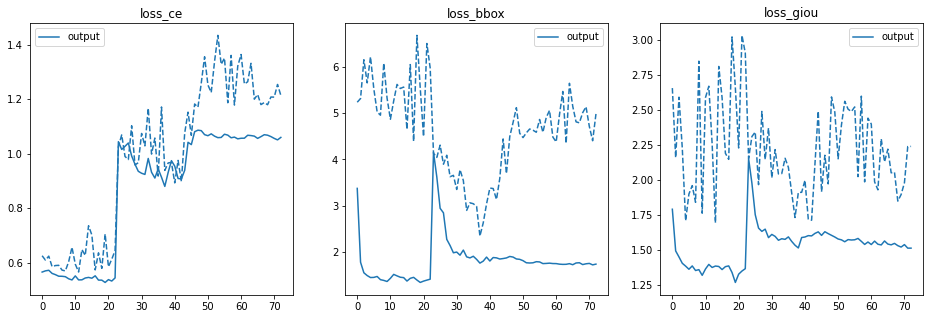

In [8]:
fields_of_interest = (
    'loss_ce',
    'loss_bbox',
    'loss_giou',
    )

plot_logs(log_directory,
          fields_of_interest)

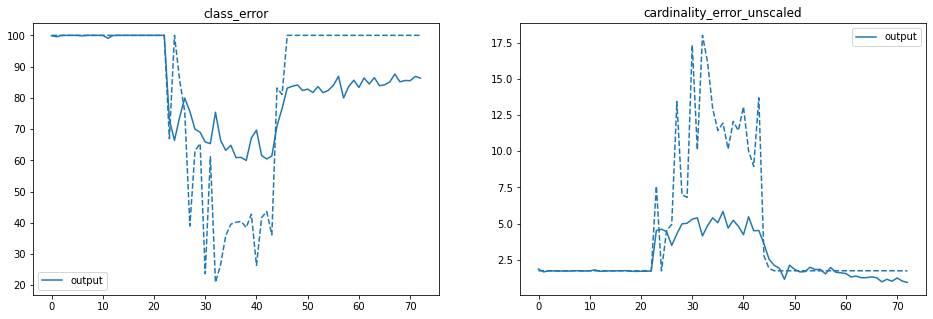

In [9]:
fields_of_interest = (
    'class_error',
    'cardinality_error_unscaled',
    )

plot_logs(log_directory,
          fields_of_interest)

In [10]:
!python -m torch.distributed.launch --nproc_per_node=1 --use_env main.py --coco_path coco --output_dir output 

/usr/local/lib/python3.7/dist-packages/torch/distributed/launch.py:186: FutureWarning: The module torch.distributed.launch is deprecated
and will be removed in future. Use torchrun.
Note that --use_env is set by default in torchrun.
If your script expects `--local_rank` argument to be set, please
change it to read from `os.environ['LOCAL_RANK']` instead. See 
https://pytorch.org/docs/stable/distributed.html#launch-utility for 
further instructions

  FutureWarning,
| distributed init (rank 0): env://
--- Logging error ---
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/distributed/elastic/agent/server/api.py", line 709, in run
    result = self._invoke_run(role)
  File "/usr/local/lib/python3.7/dist-packages/torch/distributed/elastic/agent/server/api.py", line 843, in _invoke_run
    time.sleep(monitor_interval)
  File "/usr/local/lib/python3.7/dist-packages/torch/distributed/elastic/multiprocessing/api.py", line 60, in _terminate_process_handler

In [ ]:
!python -m torch.distributed.launch --nproc_per_node=1 --use_env main.py --coco_path coco/2017  --coco_panoptic_path coco/2017 --dataset_file coco_panoptic --output_dir /output/path/box_model


/usr/local/lib/python3.7/dist-packages/torch/distributed/launch.py:186: FutureWarning: The module torch.distributed.launch is deprecated
and will be removed in future. Use torchrun.
Note that --use_env is set by default in torchrun.
If your script expects `--local_rank` argument to be set, please
change it to read from `os.environ['LOCAL_RANK']` instead. See 
https://pytorch.org/docs/stable/distributed.html#launch-utility for 
further instructions

  FutureWarning,
| distributed init (rank 0): env://
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='coco', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_backend='nccl', dist_url='env://', distributed=True, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=1, eval=False, frozen_weights=None, giou_l